## Police Reported Crime Trends Analysis: West Yorkshire (April-September 2020)

### 1. Introduction and Objectives

#### Background
This analysis examines crime data from West Yorkshire Police covering six months during 2020. This period is particularly interesting as it coincides with the early months of the COVID-19 pandemic and associated lockdown measures, which may have influenced crime patterns.

#### Methodology
The analysis follows a systematic approach:
- Comprehensive data exploration and quality assessment
- Trend analysis across crime types and time periods
- Statistical analysis of changes
- Validation of findings and identification of limitations

In [73]:
# Essential imports and setup
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime

plt.style.use('default')
sns.set_palette("Set2")

# Load data function (generalizable for additional months)
def load_crime_data(data_folder="../data"):
    months = ['2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09']
    dataframes = []
    
    for month in months:
        filename = f"{month}-west-yorkshire-street.csv"
        file_path = os.path.join(data_folder, filename)
        if os.path.exists(file_path):
            dataframes.append(pd.read_csv(file_path))
    
    return pd.concat(dataframes, ignore_index=True) if dataframes else None

# Load and summarize data
crime_data = load_crime_data()
print(f"Dataset: {len(crime_data):,} records, {len(crime_data.columns)} columns")

# Handle missing values in Month column for min/max
valid_months = crime_data['Month'].dropna()
if len(valid_months) > 0:
    print(f"Period: {valid_months.min()} to {valid_months.max()}")
else:
    print("Period: No valid month data")


Dataset: 158,898 records, 13 columns
Period: 2020-04 to 2020-09


### 1. Data Loading and Preparation
This section focuses on loading the crime data from multiple CSV files, each representing a month of reported crimes. The data is combined into a single DataFrame for further analysis.





In [72]:
# 1. DATA LOADING AND INITIAL EXPLORATION
print("\n1. DATA LOADING")

def load_crime_data(data_folder="../data"):
    """
    Load crime data from multiple CSV files covering April-September 2020.
    This function expects files named in the format: 'YYYY-MM-west-yorkshire-street.csv'.
    
    Args:
        data_folder (str): Path to the folder containing CSV files
    
    Returns:
        tuple: Combined DataFrame and loading summary DataFrame
    """

    # Define the months we expect (can be easily modified for additional months)
    months = ['2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09']
    
    dataframes = []
    loading_summary = []
    
    print("Loading crime data files...")
    print(f"Data folder: {os.path.abspath(data_folder)}")
    
    # Iterate through each month and load the corresponding file
    for month in months:
        # Construct the filename based on the month
        filename = f"{month}-west-yorkshire-street.csv"
        file_path = os.path.join(data_folder, filename)
        
        # Check if file exists
        if not os.path.exists(file_path):
            loading_summary.append({
                'Month': month,
                'Filename': filename,
                'Rows': 0,
                'Columns': 0,
                'Status': 'File not found'
            })
            print(f"✗ {month}: File not found - {filename}")
            continue
        
        # Load the CSV file
        df = pd.read_csv(file_path)
        
        # Add loading summary info
        loading_summary.append({
            'Month': month,
            'Filename': filename,
            'Rows': len(df),
            'Columns': len(df.columns),
            'Status': 'Loaded successfully'
        })
        
        dataframes.append(df)
        print(f"✓ {month}: {len(df):,} records loaded from {filename}")
    
    # Combine all dataframes
    if dataframes:
        combined_df = pd.concat(dataframes, ignore_index=True)
        print(f"\n Successfully combined data from {len(dataframes)} files")
        print(f" Total records loaded: {len(combined_df):,}")
        return combined_df, pd.DataFrame(loading_summary)
    else:
        print("No data files were successfully loaded.")
        return None, pd.DataFrame(loading_summary)

# Load the data
crime_data, loading_summary = load_crime_data()




1. DATA LOADING
Loading crime data files...
Data folder: d:\Personal\Jobs applications\Lida 2025\reported-crimes-analysis\data
✓ 2020-04: 21,785 records loaded from 2020-04-west-yorkshire-street.csv
✓ 2020-05: 24,657 records loaded from 2020-05-west-yorkshire-street.csv
✓ 2020-06: 26,730 records loaded from 2020-06-west-yorkshire-street.csv
✓ 2020-07: 29,278 records loaded from 2020-07-west-yorkshire-street.csv
✓ 2020-08: 29,433 records loaded from 2020-08-west-yorkshire-street.csv
✓ 2020-09: 27,015 records loaded from 2020-09-west-yorkshire-street.csv

 Successfully combined data from 6 files
 Total records loaded: 158,898


### 2. Initial Data Exploration

This section provides an overview of the dataset structure and initial insights into the data quality and completeness.

In [55]:
# 2. INITIAL DATA STRUCTURE EXAMINATION
def data_structure_fun(df):
    """
    Prints a structured summary of the dataframe's columns,
    including types, non-null counts, and percentage of non-null values.
    """
    bold = "\033[1m"
    reset = "\033[0m"
    print(f"\n COLUMN DETAILS")
    print(f"{bold}{'No.':<4} {'Column Name':<25} {'Type':<12} {'Non-null Count':>15} {'Non-null %':>12}{reset}")

    for i, col in enumerate(df.columns, 1):
        non_null = df[col].notna().sum()
        null_count = df[col].isna().sum()
        null_pct = (null_count / len(df)) * 100
        print(f"{i:<4} {col:<25} {str(df[col].dtype):<12} {non_null:>15,} {100-null_pct:>11.1f}%")
data_structure_examination = data_structure_fun(crime_data)



 COLUMN DETAILS
No.  Column Name               Type          Non-null Count   Non-null %
1    Unnamed: 0                int64                158,898       100.0%
2    Crime ID                  object               129,209        81.3%
3    Month                     object               156,898        98.7%
4    Falls within              object               127,620        80.3%
5    Longitude                 float64              153,411        96.5%
6    Latitude                  float64              153,411        96.5%
7    Location                  object               156,898        98.7%
8    LSOA code                 object               153,410        96.5%
9    LSOA name                 object               153,410        96.5%
10   Crime type                object               156,898        98.7%
11   Last outcome category     object               127,564        80.3%
12   Context                   float64                    0         0.0%
13   Reported by               obj

### 3. Missing Data Analysis
This section examines the extent of missing data across various fields in the dataset, providing a summary of missing values and their potential impact on analysis.


In [58]:
def missing_data_fun(df):
    """
    Prints a summary of missing data per column in a structured format.
    """
    print("\n3. MISSING DATA ANALYSIS")
    
    bold = "\033[1m"
    reset = "\033[0m"
    
    print(f"{bold}{'Column Name':<25} {'Missing Count':>15} {'Missing %':>12}{reset}")
    
    for col in df.columns:
        missing_count = df[col].isna().sum()
        missing_pct = (missing_count / len(df)) * 100
        print(f"{col:<25} {missing_count:>15,} {missing_pct:>11.1f}%")
missing_data = missing_data_fun(crime_data)


3. MISSING DATA ANALYSIS
Column Name                 Missing Count    Missing %
Unnamed: 0                              0         0.0%
Crime ID                           29,689        18.7%
Month                               2,000         1.3%
Falls within                       31,278        19.7%
Longitude                           5,487         3.5%
Latitude                            5,487         3.5%
Location                            2,000         1.3%
LSOA code                           5,488         3.5%
LSOA name                           5,488         3.5%
Crime type                          2,000         1.3%
Last outcome category              31,334        19.7%
Context                           158,898       100.0%
Reported by                        23,785        15.0%


In [68]:
# 3. IDENTIFY DATA ANOMALIES AND PATTERNS
def analyse_data_anomalies(df):
    """
    Analyzes duplicates, geographic data validity, and crime type distribution.
    """
    print(f"\n 3.  DATA ANOMALIES AND PATTERNS")

    # Duplicate analysis
    print("DUPLICATE ANALYSIS:")
    total_duplicates = df.duplicated().sum()
    print(f"   • Complete duplicate rows: {total_duplicates:,}")

    if 'Crime ID' in df.columns:
        crime_id_duplicates = df[df['Crime ID'].notna()]['Crime ID'].duplicated().sum()
        print(f"   • Duplicate Crime IDs: {crime_id_duplicates:,}")

    # Geographic data validation
    print(f"\n GEOGRAPHIC DATA VALIDATION:")
    if {'Longitude', 'Latitude'}.issubset(df.columns):
        coords_df = df[['Longitude', 'Latitude']].dropna()
        uk_lon_range = (-8, 2)
        uk_lat_range = (49, 61)
        invalid_coords = coords_df[
            (coords_df['Longitude'] < uk_lon_range[0]) | 
            (coords_df['Longitude'] > uk_lon_range[1]) |
            (coords_df['Latitude'] < uk_lat_range[0]) | 
            (coords_df['Latitude'] > uk_lat_range[1])
        ]

        print(f"   • Valid coordinate records: {len(coords_df):,}")
        print(f"   • Coordinates outside UK bounds: {len(invalid_coords):,}")

        print(f"   • Longitude range: {coords_df['Longitude'].min():.6f} to {coords_df['Longitude'].max():.6f}")
        print(f"   • Latitude range: {coords_df['Latitude'].min():.6f} to {coords_df['Latitude'].max():.6f}")
        
data_anomalities = analyse_data_anomalies(crime_data)


 3.  DATA ANOMALIES AND PATTERNS
DUPLICATE ANALYSIS:
   • Complete duplicate rows: 1
   • Duplicate Crime IDs: 2

 GEOGRAPHIC DATA VALIDATION:
   • Valid coordinate records: 153,411
   • Coordinates outside UK bounds: 118
   • Longitude range: -99.342253 to 98.150160
   • Latitude range: -96.415042 to 99.528496


In [ ]:
# 4. CRIME TYPE ANALYSIS AND TRENDS
print("\n4. CRIME TYPE ANALYSIS AND TRENDS")
print("=" * 45)

# Clean data for analysis (remove records with missing essential info)
print("🧹 DATA PREPARATION FOR ANALYSIS")
print("-" * 35)

# Create clean dataset for trend analysis
clean_data = crime_data.dropna(subset=['Month', 'Crime type']).copy()
print(f"• Original dataset: {len(crime_data):,} records")
print(f"• Clean dataset: {len(clean_data):,} records")
print(f"• Records removed: {len(crime_data) - len(clean_data):,} ({((len(crime_data) - len(clean_data))/len(crime_data)*100):.1f}%)")

# Create month-crime type summary
monthly_crime_summary = clean_data.groupby(['Month', 'Crime type']).size().reset_index(name='Count')
total_by_month = clean_data.groupby('Month').size().reset_index(name='Total')

print(f"\n📊 OVERALL CRIME VOLUME TRENDS")
print("-" * 35)

# Overall monthly totals
print("Total crimes per month:")
for _, row in total_by_month.iterrows():
    print(f"   • {row['Month']}: {row['Total']:,} crimes")

# Calculate overall trend
monthly_totals = total_by_month.set_index('Month')['Total']
overall_change = ((monthly_totals.iloc[-1] - monthly_totals.iloc[0]) / monthly_totals.iloc[0]) * 100
peak_month = monthly_totals.idxmax()
lowest_month = monthly_totals.idxmin()

print(f"\n📈 Overall trend: {overall_change:+.1f}% change from April to September")
print(f"🔝 Peak month: {peak_month} ({monthly_totals[peak_month]:,} crimes)")
print(f"🔻 Lowest month: {lowest_month} ({monthly_totals[lowest_month]:,} crimes)")


4. CRIME TYPE ANALYSIS AND TRENDS
🧹 DATA PREPARATION FOR ANALYSIS
-----------------------------------
• Original dataset: 158,898 records
• Clean dataset: 156,898 records
• Records removed: 2,000 (1.3%)

📊 OVERALL CRIME VOLUME TRENDS
-----------------------------------
Total crimes per month:
   • 2020-04: 21,785 crimes
   • 2020-05: 23,657 crimes
   • 2020-06: 26,730 crimes
   • 2020-07: 29,278 crimes
   • 2020-08: 29,433 crimes
   • 2020-09: 26,015 crimes

📈 Overall trend: +19.4% change from April to September
🔝 Peak month: 2020-08 (29,433 crimes)
🔻 Lowest month: 2020-04 (21,785 crimes)


In [75]:
# CRIME TYPE DISTRIBUTION ANALYSIS
print(f"\n🚨 CRIME TYPE DISTRIBUTION ANALYSIS")
print("-" * 40)

# Get overall crime type distribution
crime_type_totals = clean_data['Crime type'].value_counts()
print(f"Total unique crime types: {len(crime_type_totals)}")

print(f"\nTop 10 crime types by total volume:")
for i, (crime_type, count) in enumerate(crime_type_totals.head(10).items(), 1):
    percentage = (count / len(clean_data)) * 100
    print(f"{i:2d}. {crime_type:<35}: {count:>6,} ({percentage:4.1f}%)")

# Create crime type trend analysis
print(f"\n📊 MONTH-BY-MONTH CRIME TYPE ANALYSIS")
print("-" * 42)

# Create pivot table for easier analysis
crime_pivot = monthly_crime_summary.pivot(index='Crime type', columns='Month', values='Count').fillna(0)

# Calculate trends for each crime type
crime_trends = []
for crime_type in crime_pivot.index:
    april_count = crime_pivot.loc[crime_type, '2020-04']
    sept_count = crime_pivot.loc[crime_type, '2020-09']
    
    if april_count > 0:  # Avoid division by zero
        change_pct = ((sept_count - april_count) / april_count) * 100
    else:
        change_pct = 0 if sept_count == 0 else float('inf')
    
    total_crimes = crime_pivot.loc[crime_type].sum()
    
    crime_trends.append({
        'Crime Type': crime_type,
        'April': int(april_count),
        'September': int(sept_count),
        'Change_Pct': change_pct,
        'Total_6_Months': int(total_crimes),
        'Trend': 'Increasing' if change_pct > 5 else 'Decreasing' if change_pct < -5 else 'Stable'
    })

trends_df = pd.DataFrame(crime_trends).sort_values('Total_6_Months', ascending=False)

print("Crime type trends (April → September 2020):")
print("=" * 80)
for _, row in trends_df.iterrows():
    trend_emoji = "📈" if row['Trend'] == 'Increasing' else "📉" if row['Trend'] == 'Decreasing' else "➡️"
    print(f"{trend_emoji} {row['Crime Type']:<35}")
    print(f"    Apr: {row['April']:>4,} → Sep: {row['September']:>4,} | Change: {row['Change_Pct']:+6.1f}% | Total: {row['Total_6_Months']:,}")
    print()


🚨 CRIME TYPE DISTRIBUTION ANALYSIS
----------------------------------------
Total unique crime types: 15

Top 10 crime types by total volume:
 1. Violence and sexual offences       : 57,483 (36.6%)
 2. Anti-social behaviour              : 29,314 (18.7%)
 3. Public order                       : 17,911 (11.4%)
 4. Criminal damage and arson          : 13,054 ( 8.3%)
 5. Other theft                        :  8,319 ( 5.3%)
 6. Burglary                           :  7,046 ( 4.5%)
 7. Vehicle crime                      :  6,442 ( 4.1%)
 8. Shoplifting                        :  4,757 ( 3.0%)
 9. Drugs                              :  4,553 ( 2.9%)
10. Other crime                        :  3,718 ( 2.4%)

📊 MONTH-BY-MONTH CRIME TYPE ANALYSIS
------------------------------------------
Crime type trends (April → September 2020):
📈 Violence and sexual offences       
    Apr: 8,271 → Sep: 9,397 | Change:  +13.6% | Total: 57,483

📈 Anti-social behaviour              
    Apr: 3,398 → Sep: 4,491 | Cha

In [76]:
# CRIME TYPE DISTRIBUTION ANALYSIS
print(f"\n🚨 CRIME TYPE DISTRIBUTION ANALYSIS")
print("-" * 40)

# Get overall crime type distribution
crime_type_totals = clean_data['Crime type'].value_counts()
print(f"Total unique crime types: {len(crime_type_totals)}")

print(f"\nTop 10 crime types by total volume:")
for i, (crime_type, count) in enumerate(crime_type_totals.head(10).items(), 1):
    percentage = (count / len(clean_data)) * 100
    print(f"{i:2d}. {crime_type:<35}: {count:>6,} ({percentage:4.1f}%)")

# Create crime type trend analysis
print(f"\n📊 MONTH-BY-MONTH CRIME TYPE ANALYSIS")
print("-" * 42)

# Create pivot table for easier analysis
crime_pivot = monthly_crime_summary.pivot(index='Crime type', columns='Month', values='Count').fillna(0)

# Calculate trends for each crime type
crime_trends = []
for crime_type in crime_pivot.index:
    april_count = crime_pivot.loc[crime_type, '2020-04']
    sept_count = crime_pivot.loc[crime_type, '2020-09']
    
    if april_count > 0:  # Avoid division by zero
        change_pct = ((sept_count - april_count) / april_count) * 100
    else:
        change_pct = 0 if sept_count == 0 else float('inf')
    
    total_crimes = crime_pivot.loc[crime_type].sum()
    
    crime_trends.append({
        'Crime Type': crime_type,
        'April': int(april_count),
        'September': int(sept_count),
        'Change_Pct': change_pct,
        'Total_6_Months': int(total_crimes),
        'Trend': 'Increasing' if change_pct > 5 else 'Decreasing' if change_pct < -5 else 'Stable'
    })

trends_df = pd.DataFrame(crime_trends).sort_values('Total_6_Months', ascending=False)

print("Crime type trends (April → September 2020):")
print("=" * 80)
for _, row in trends_df.iterrows():
    trend_emoji = "📈" if row['Trend'] == 'Increasing' else "📉" if row['Trend'] == 'Decreasing' else "➡️"
    print(f"{trend_emoji} {row['Crime Type']:<35}")
    print(f"    Apr: {row['April']:>4,} → Sep: {row['September']:>4,} | Change: {row['Change_Pct']:+6.1f}% | Total: {row['Total_6_Months']:,}")
    print()


🚨 CRIME TYPE DISTRIBUTION ANALYSIS
----------------------------------------
Total unique crime types: 15

Top 10 crime types by total volume:
 1. Violence and sexual offences       : 57,483 (36.6%)
 2. Anti-social behaviour              : 29,314 (18.7%)
 3. Public order                       : 17,911 (11.4%)
 4. Criminal damage and arson          : 13,054 ( 8.3%)
 5. Other theft                        :  8,319 ( 5.3%)
 6. Burglary                           :  7,046 ( 4.5%)
 7. Vehicle crime                      :  6,442 ( 4.1%)
 8. Shoplifting                        :  4,757 ( 3.0%)
 9. Drugs                              :  4,553 ( 2.9%)
10. Other crime                        :  3,718 ( 2.4%)

📊 MONTH-BY-MONTH CRIME TYPE ANALYSIS
------------------------------------------
Crime type trends (April → September 2020):
📈 Violence and sexual offences       
    Apr: 8,271 → Sep: 9,397 | Change:  +13.6% | Total: 57,483

📈 Anti-social behaviour              
    Apr: 3,398 → Sep: 4,491 | Cha

In [78]:
# STATISTICAL ANALYSIS OF TRENDS
print(f"\n📊 STATISTICAL ANALYSIS OF TRENDS")
print("-" * 38)

# Focus on top crime types for detailed analysis
top_crime_types = crime_type_totals.head(5).index.tolist()

print("Detailed analysis of top 5 crime types:")
print("=" * 45)

for crime_type in top_crime_types:
    crime_monthly = crime_pivot.loc[crime_type]
    
    print(f"\n🔍 {crime_type.upper()}")
    print("-" * (len(crime_type) + 4))
    
    # Monthly breakdown
    print("Monthly counts:")
    for month in crime_monthly.index:
        count = int(crime_monthly[month])
        print(f"   • {month}: {count:,}")
    
    # Calculate statistics
    mean_monthly = crime_monthly.mean()
    std_monthly = crime_monthly.std()
    min_month = crime_monthly.idxmin()
    max_month = crime_monthly.idxmax()
    
    print(f"\nStatistics:")
    print(f"   • Monthly average: {mean_monthly:.1f}")
    print(f"   • Standard deviation: {std_monthly:.1f}")
    print(f"   • Lowest month: {min_month} ({int(crime_monthly[min_month]):,})")
    print(f"   • Highest month: {max_month} ({int(crime_monthly[max_month]):,})")
    
    # Trend analysis
    april_to_sept = ((crime_monthly['2020-09'] - crime_monthly['2020-04']) / crime_monthly['2020-04']) * 100
    print(f"   • April to September change: {april_to_sept:+.1f}%")
    
    # Identify pattern
    if crime_monthly['2020-04'] > crime_monthly['2020-05'] > crime_monthly['2020-06']:
        pattern = "Consistent decline from April"
    elif crime_monthly['2020-07'] > crime_monthly['2020-08'] > crime_monthly['2020-09']:
        pattern = "Decline in summer months"
    elif crime_monthly['2020-09'] > crime_monthly['2020-08'] > crime_monthly['2020-07']:
        pattern = "Increasing towards September"
    else:
        pattern = "Mixed pattern"
    
    print(f"   • Pattern: {pattern}")


📊 STATISTICAL ANALYSIS OF TRENDS
--------------------------------------
Detailed analysis of top 5 crime types:

🔍 VIOLENCE AND SEXUAL OFFENCES
--------------------------------
Monthly counts:
   • 2020-04: 8,271
   • 2020-05: 8,793
   • 2020-06: 9,787
   • 2020-07: 10,721
   • 2020-08: 10,514
   • 2020-09: 9,397

Statistics:
   • Monthly average: 9580.5
   • Standard deviation: 957.4
   • Lowest month: 2020-04 (8,271)
   • Highest month: 2020-07 (10,721)
   • April to September change: +13.6%
   • Pattern: Decline in summer months

🔍 ANTI-SOCIAL BEHAVIOUR
-------------------------
Monthly counts:
   • 2020-04: 3,398
   • 2020-05: 4,388
   • 2020-06: 5,384
   • 2020-07: 5,825
   • 2020-08: 5,828
   • 2020-09: 4,491

Statistics:
   • Monthly average: 4885.7
   • Standard deviation: 962.8
   • Lowest month: 2020-04 (3,398)
   • Highest month: 2020-08 (5,828)
   • April to September change: +32.2%
   • Pattern: Mixed pattern

🔍 PUBLIC ORDER
----------------
Monthly counts:
   • 2020-04: 

In [79]:
# COVID-19 CONTEXT ANALYSIS
print(f"\n🦠 COVID-19 CONTEXT ANALYSIS")
print("-" * 32)

print("Timeline context for interpretation:")
print("• April 2020: Full national lockdown in effect")
print("• May 2020: Some restrictions begin to ease")
print("• June 2020: Non-essential shops reopen")
print("• July 2020: Pubs and restaurants reopen")
print("• August 2020: 'Eat Out to Help Out' scheme")
print("• September 2020: Rule of Six introduced")

print(f"\nCrime patterns likely influenced by lockdown measures:")

# Identify crime types most likely affected by lockdown
lockdown_sensitive_crimes = [
    'Burglary', 'Shoplifting', 'Theft from the person', 
    'Vehicle crime', 'Public order', 'Anti-social behaviour'
]

public_space_crimes = [
    'Anti-social behaviour', 'Public order', 'Theft from the person'
]

domestic_crimes = [
    'Violence and sexual offences', 'Criminal damage and arson'
]

print(f"\n📉 Expected to DECREASE during lockdown:")
for crime in lockdown_sensitive_crimes:
    if crime in trends_df['Crime Type'].values:
        trend_data = trends_df[trends_df['Crime Type'] == crime].iloc[0]
        trend_emoji = "✅" if trend_data['Change_Pct'] < 0 else "❓"
        print(f"   {trend_emoji} {crime}: {trend_data['Change_Pct']:+.1f}% change")

print(f"\n📈 Expected to INCREASE or remain stable:")
for crime in domestic_crimes:
    if crime in trends_df['Crime Type'].values:
        trend_data = trends_df[trends_df['Crime Type'] == crime].iloc[0]
        trend_emoji = "✅" if trend_data['Change_Pct'] >= 0 else "❓"
        print(f"   {trend_emoji} {crime}: {trend_data['Change_Pct']:+.1f}% change")

# Summary of findings
print(f"\n📋 KEY FINDINGS SUMMARY")
print("-" * 25)
increasing_crimes = trends_df[trends_df['Trend'] == 'Increasing']['Crime Type'].tolist()
decreasing_crimes = trends_df[trends_df['Trend'] == 'Decreasing']['Crime Type'].tolist()
stable_crimes = trends_df[trends_df['Trend'] == 'Stable']['Crime Type'].tolist()

print(f"• Crime types increasing: {len(increasing_crimes)}")
print(f"• Crime types decreasing: {len(decreasing_crimes)}")
print(f"• Crime types stable: {len(stable_crimes)}")

if increasing_crimes:
    print(f"\nIncreasing crimes: {', '.join(increasing_crimes[:3])}{'...' if len(increasing_crimes) > 3 else ''}")
if decreasing_crimes:
    print(f"Decreasing crimes: {', '.join(decreasing_crimes[:3])}{'...' if len(decreasing_crimes) > 3 else ''}")


🦠 COVID-19 CONTEXT ANALYSIS
--------------------------------
Timeline context for interpretation:
• April 2020: Full national lockdown in effect
• May 2020: Some restrictions begin to ease
• June 2020: Non-essential shops reopen
• July 2020: Pubs and restaurants reopen
• August 2020: 'Eat Out to Help Out' scheme
• September 2020: Rule of Six introduced

Crime patterns likely influenced by lockdown measures:

📉 Expected to DECREASE during lockdown:
   ❓ Burglary: +12.3% change
   ❓ Shoplifting: +56.7% change
   ❓ Theft from the person: +122.8% change
   ❓ Vehicle crime: +13.6% change
   ❓ Public order: +18.3% change
   ❓ Anti-social behaviour: +32.2% change

📈 Expected to INCREASE or remain stable:
   ✅ Violence and sexual offences: +13.6% change
   ✅ Criminal damage and arson: +37.8% change

📋 KEY FINDINGS SUMMARY
-------------------------
• Crime types increasing: 11
• Crime types decreasing: 1
• Crime types stable: 3

Increasing crimes: Violence and sexual offences, Anti-social beha

5. DATA VISUALIZATION
✓ Chart 1: Monthly totals created
✓ Chart 2: Crime type distribution created
✓ Chart 3: Top crime types trends created
✓ Chart 4: Monthly changes created


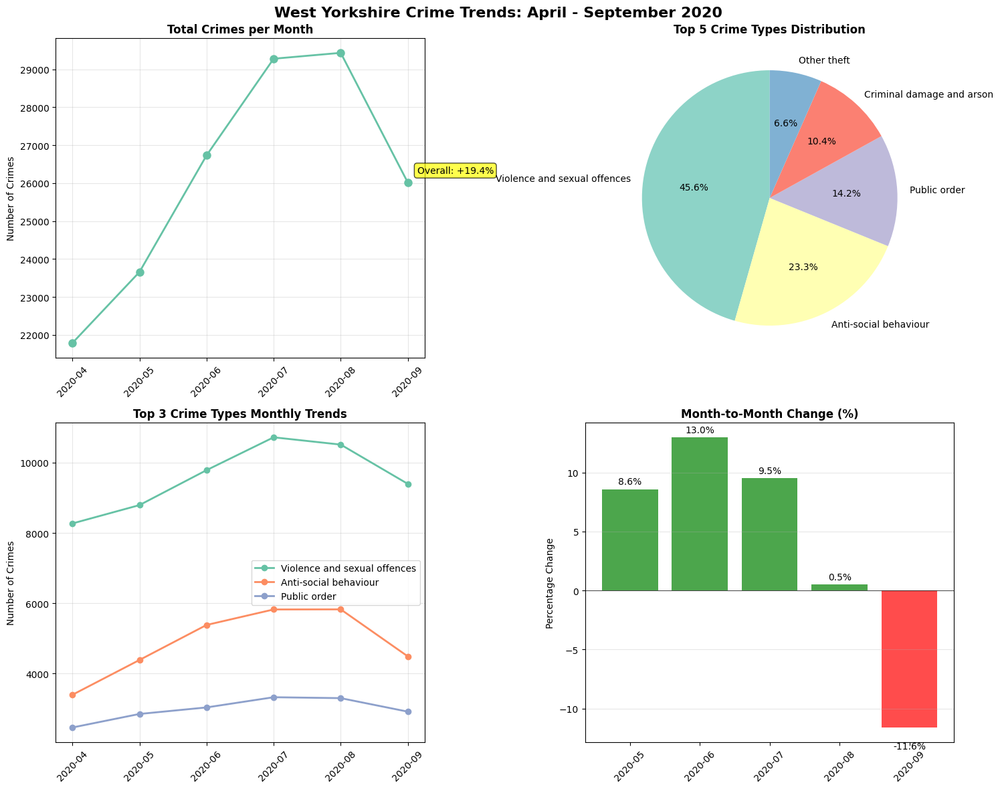


📊 All visualizations completed successfully

📋 KEY STATISTICS SUMMARY
------------------------------
                  Metric            Value
 Total Crimes (6 months)          156,898
       Average per Month            26150
           Highest Month 2020-08 (29,433)
            Lowest Month 2020-04 (21,785)
Biggest Monthly Increase 2020-06 (+13.0%)
Biggest Monthly Decrease 2020-09 (-11.6%)


In [87]:
# 5. DATA VISUALIZATION
print("5. DATA VISUALIZATION")
print("=" * 25)

# Set up plotting parameters
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

# Create subplot layout
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('West Yorkshire Crime Trends: April - September 2020', fontsize=16, fontweight='bold')

# Chart 1: Overall monthly trends
monthly_totals = clean_data.groupby('Month').size()
ax1.plot(monthly_totals.index, monthly_totals.values, marker='o', linewidth=2, markersize=8)
ax1.set_title('Total Crimes per Month', fontweight='bold')
ax1.set_ylabel('Number of Crimes')
ax1.grid(True, alpha=0.3)
ax1.tick_params(axis='x', rotation=45)

# Add trend annotation
trend_pct = ((monthly_totals.iloc[-1] - monthly_totals.iloc[0]) / monthly_totals.iloc[0]) * 100
ax1.annotate(f'Overall: {trend_pct:+.1f}%', 
             xy=(monthly_totals.index[-1], monthly_totals.iloc[-1]),
             xytext=(10, 10), textcoords='offset points',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

print("✓ Chart 1: Monthly totals created")

# Chart 2: Top 5 crime types distribution
top_5_crimes = clean_data['Crime type'].value_counts().head(5)
colors = plt.cm.Set3(range(len(top_5_crimes)))

ax2.pie(top_5_crimes.values, labels=top_5_crimes.index, autopct='%1.1f%%', 
        colors=colors, startangle=90)
ax2.set_title('Top 5 Crime Types Distribution', fontweight='bold')

print("✓ Chart 2: Crime type distribution created")

# Chart 3: Trend comparison for top 3 crime types
top_3_crimes = clean_data['Crime type'].value_counts().head(3).index

for crime_type in top_3_crimes:
    crime_monthly = clean_data[clean_data['Crime type'] == crime_type].groupby('Month').size()
    ax3.plot(crime_monthly.index, crime_monthly.values, marker='o', label=crime_type, linewidth=2)

ax3.set_title('Top 3 Crime Types Monthly Trends', fontweight='bold')
ax3.set_ylabel('Number of Crimes')
ax3.legend()
ax3.grid(True, alpha=0.3)
ax3.tick_params(axis='x', rotation=45)

print("✓ Chart 3: Top crime types trends created")

# Chart 4: Month-to-month percentage changes
monthly_changes = monthly_totals.pct_change() * 100
monthly_changes = monthly_changes.dropna()

colors = ['green' if x > 0 else 'red' for x in monthly_changes.values]
bars = ax4.bar(range(len(monthly_changes)), monthly_changes.values, color=colors, alpha=0.7)
ax4.set_title('Month-to-Month Change (%)', fontweight='bold')
ax4.set_ylabel('Percentage Change')
ax4.set_xticks(range(len(monthly_changes)))
ax4.set_xticklabels(monthly_changes.index, rotation=45)
ax4.grid(True, alpha=0.3, axis='y')
ax4.axhline(y=0, color='black', linestyle='-', linewidth=0.5)

# Add value labels on bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax4.annotate(f'{height:.1f}%',
                xy=(bar.get_x() + bar.get_width()/2, height),
                xytext=(0, 3 if height > 0 else -15),
                textcoords="offset points",
                ha='center', va='bottom' if height > 0 else 'top')

print("✓ Chart 4: Monthly changes created")

plt.tight_layout()
plt.show()

print(f"\n📊 All visualizations completed successfully")
# Summary table of key statistics
print(f"\n📋 KEY STATISTICS SUMMARY")
print("-" * 30)

summary_stats = {
    'Metric': [
        'Total Crimes (6 months)',
        'Average per Month',
        'Highest Month',
        'Lowest Month',
        'Biggest Monthly Increase',
        'Biggest Monthly Decrease'
    ],
    'Value': [
        f"{len(clean_data):,}",
        f"{monthly_totals.mean():.0f}",
        f"{monthly_totals.idxmax()} ({monthly_totals.max():,})",
        f"{monthly_totals.idxmin()} ({monthly_totals.min():,})",
        f"{monthly_changes.idxmax()} (+{monthly_changes.max():.1f}%)",
        f"{monthly_changes.idxmin()} ({monthly_changes.min():.1f}%)"
    ]
}

summary_df = pd.DataFrame(summary_stats)
print(summary_df.to_string(index=False))

In [88]:
# Summary table of key statistics
print(f"\n📋 KEY STATISTICS SUMMARY")
print("-" * 30)

summary_stats = {
    'Metric': [
        'Total Crimes (6 months)',
        'Average per Month',
        'Highest Month',
        'Lowest Month',
        'Biggest Monthly Increase',
        'Biggest Monthly Decrease'
    ],
    'Value': [
        f"{len(clean_data):,}",
        f"{monthly_totals.mean():.0f}",
        f"{monthly_totals.idxmax()} ({monthly_totals.max():,})",
        f"{monthly_totals.idxmin()} ({monthly_totals.min():,})",
        f"{monthly_changes.idxmax()} (+{monthly_changes.max():.1f}%)",
        f"{monthly_changes.idxmin()} ({monthly_changes.min():.1f}%)"
    ]
}

summary_df = pd.DataFrame(summary_stats)
print(summary_df.to_string(index=False))


📋 KEY STATISTICS SUMMARY
------------------------------
                  Metric            Value
 Total Crimes (6 months)          156,898
       Average per Month            26150
           Highest Month 2020-08 (29,433)
            Lowest Month 2020-04 (21,785)
Biggest Monthly Increase 2020-06 (+13.0%)
Biggest Monthly Decrease 2020-09 (-11.6%)


ADDITIONAL KEY VISUALIZATIONS
✓ Geographic plot: 153,411 crimes plotted
✓ Crime outcomes chart created
✓ Heatmap created
✓ Data completeness chart created


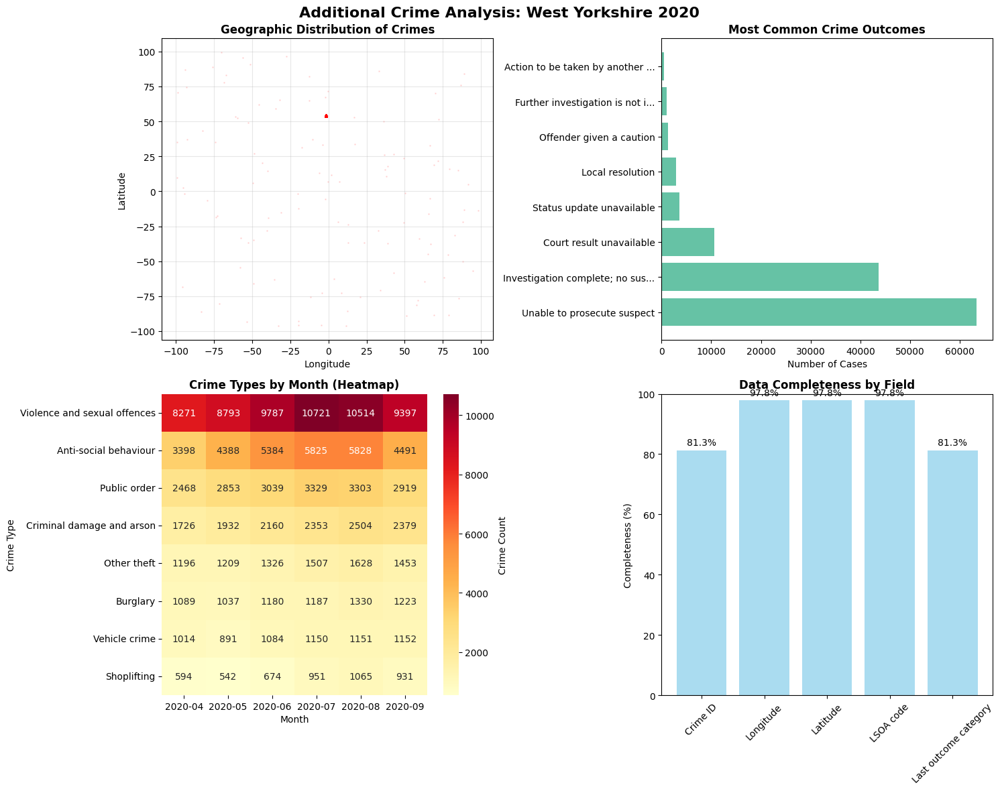

ConversionError: Failed to convert value(s) to axis units: '2020-04'

Error in callback <function _draw_all_if_interactive at 0x0000022D7FB79EA0> (for post_execute), with arguments args (),kwargs {}:


ConversionError: Failed to convert value(s) to axis units: '2020-04'

ConversionError: Failed to convert value(s) to axis units: '2020-04'

<Figure size 1200x600 with 1 Axes>

In [ ]:
# ADDITIONAL IMPORTANT VISUALIZATIONS
print("ADDITIONAL KEY VISUALIZATIONS")
print("=" * 35)

# Create additional plots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Additional Crime Analysis: West Yorkshire 2020', fontsize=16, fontweight='bold')

# Chart 5: Geographic distribution (if coordinates available)
coords_data = clean_data.dropna(subset=['Longitude', 'Latitude'])
if len(coords_data) > 1000:  # Only if enough data
    ax1.scatter(coords_data['Longitude'], coords_data['Latitude'], 
               alpha=0.1, s=1, c='red')
    ax1.set_title('Geographic Distribution of Crimes', fontweight='bold')
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    ax1.grid(True, alpha=0.3)
    print(f"✓ Geographic plot: {len(coords_data):,} crimes plotted")
else:
    ax1.text(0.5, 0.5, 'Insufficient geographic data', 
             transform=ax1.transAxes, ha='center', va='center')
    ax1.set_title('Geographic Distribution - Insufficient Data')

# Chart 6: Crime outcome analysis
outcomes = clean_data['Last outcome category'].value_counts().head(8)
if not outcomes.empty:
    ax2.barh(range(len(outcomes)), outcomes.values)
    ax2.set_yticks(range(len(outcomes)))
    ax2.set_yticklabels([label[:30] + '...' if len(label) > 30 else label 
                        for label in outcomes.index])
    ax2.set_title('Most Common Crime Outcomes', fontweight='bold')
    ax2.set_xlabel('Number of Cases')
    print("✓ Crime outcomes chart created")
else:
    ax2.text(0.5, 0.5, 'No outcome data available', 
             transform=ax2.transAxes, ha='center', va='center')
    
# Chart 7: Heatmap of crime types by month
crime_heatmap_data = clean_data.groupby(['Crime type', 'Month']).size().unstack(fill_value=0)

# Select top 8 crime types for readability
top_crimes_for_heatmap = clean_data['Crime type'].value_counts().head(8).index
heatmap_subset = crime_heatmap_data.loc[top_crimes_for_heatmap]

sns.heatmap(heatmap_subset, annot=True, fmt='d', cmap='YlOrRd', ax=ax3, cbar_kws={'label': 'Crime Count'})
ax3.set_title('Crime Types by Month (Heatmap)', fontweight='bold')
ax3.set_xlabel('Month')
ax3.set_ylabel('Crime Type')
print("✓ Heatmap created")

# Chart 8: Weekend vs Weekday analysis (if possible from location patterns)
# Alternative: Data completeness analysis
completeness_data = []
for col in ['Crime ID', 'Longitude', 'Latitude', 'LSOA code', 'Last outcome category']:
    if col in clean_data.columns:
        complete_pct = (clean_data[col].notna().sum() / len(clean_data)) * 100
        completeness_data.append({'Field': col, 'Completeness': complete_pct})

if completeness_data:
    comp_df = pd.DataFrame(completeness_data)
    bars = ax4.bar(comp_df['Field'], comp_df['Completeness'], color='skyblue', alpha=0.7)
    ax4.set_title('Data Completeness by Field', fontweight='bold')
    ax4.set_ylabel('Completeness (%)')
    ax4.set_ylim(0, 100)
    ax4.tick_params(axis='x', rotation=45)
    
    # Add percentage labels
    for bar, pct in zip(bars, comp_df['Completeness']):
        ax4.annotate(f'{pct:.1f}%',
                    xy=(bar.get_x() + bar.get_width()/2, bar.get_height()),
                    xytext=(0, 3), textcoords="offset points",
                    ha='center', va='bottom')
    
    print("✓ Data completeness chart created")

plt.tight_layout()
plt.show()



MAP VISUALIZATIONS
Records with coordinates: 153,411 out of 156,898


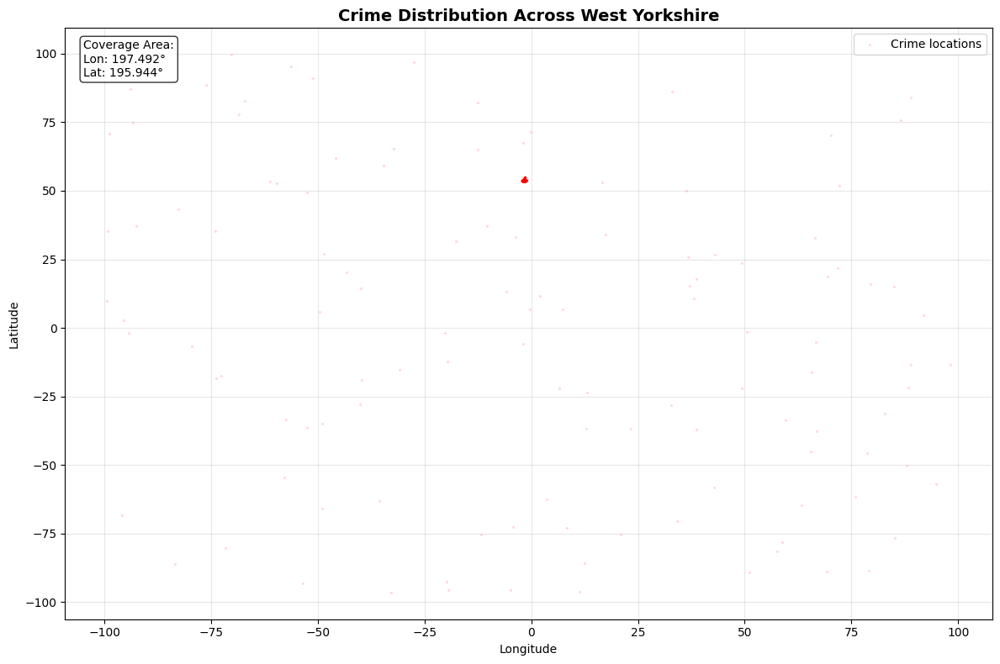

✓ Basic geographic scatter plot created


In [98]:
# MAP VISUALIZATIONS
print("MAP VISUALIZATIONS")
print("=" * 20)

# Check available geographic data
coords_data = clean_data.dropna(subset=['Longitude', 'Latitude'])
print(f"Records with coordinates: {len(coords_data):,} out of {len(clean_data):,}")

if len(coords_data) > 100:  # Only proceed if we have enough data
    
    # Method 1: Simple scatter plot map
    plt.figure(figsize=(12, 8))
    
    # Basic geographic plot
    plt.scatter(coords_data['Longitude'], coords_data['Latitude'], 
               alpha=0.1, s=2, c='red', label='Crime locations')
    
    plt.title('Crime Distribution Across West Yorkshire', fontsize=14, fontweight='bold')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # Add coordinate bounds info
    lon_range = coords_data['Longitude'].max() - coords_data['Longitude'].min()
    lat_range = coords_data['Latitude'].max() - coords_data['Latitude'].min()
    
    plt.text(0.02, 0.98, f'Coverage Area:\nLon: {lon_range:.3f}°\nLat: {lat_range:.3f}°', 
             transform=plt.gca().transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    print("✓ Basic geographic scatter plot created")

In [107]:
!pip install folium

     -------------------------------------- 113.4/113.4 KB 3.3 MB/s eta 0:00:00
  Using cached jinja2-3.1.6-py3-none-any.whl (134 kB)
     ---------------------------------------- 90.4/90.4 KB ? eta 0:00:00
  Using cached MarkupSafe-3.0.2-cp310-cp310-win_amd64.whl (15 kB)


You should consider upgrading via the 'D:\Personal\Jobs applications\Lida 2025\reported-crimes-analysis\venv\Scripts\python.exe -m pip install --upgrade pip' command.


In [108]:
# WEST YORKSHIRE MAP VISUALIZATIONS
print("WEST YORKSHIRE MAP VISUALIZATIONS")
print("=" * 40)

# Install required packages (run this cell first if needed)
# !pip install folium contextily geopandas

try:
    import folium
    from folium import plugins
    folium_available = True
    print("✓ Folium available for interactive maps")
except ImportError:
    folium_available = False
    print("⚠️  Folium not available - will create basic maps")

# Check coordinate data
coords_data = clean_data.dropna(subset=['Longitude', 'Latitude'])
print(f"Records with coordinates: {len(coords_data):,}")

if len(coords_data) > 100:
    # Calculate center point for West Yorkshire
    center_lat = coords_data['Latitude'].mean()
    center_lon = coords_data['Longitude'].mean()
    
    print(f"Map center: ({center_lat:.4f}, {center_lon:.4f})")

WEST YORKSHIRE MAP VISUALIZATIONS
✓ Folium available for interactive maps
Records with coordinates: 153,411
Map center: (53.7140, -1.6467)


In [109]:
# Create the interactive maps
print("Creating interactive West Yorkshire crime maps...")

# Method 1: Interactive Crime Distribution Map
print("\n1. Creating main crime distribution map...")

# Create base map centered on West Yorkshire
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=10,
    tiles='OpenStreetMap'
)

# Add title
title_html = '''
             <h3 align="center" style="font-size:16px"><b>West Yorkshire Crime Distribution<br>
             April - September 2020</b></h3>
             '''
m.get_root().html.add_child(folium.Element(title_html))

# Sample data for performance (5000 points for good visualization without lag)
sample_data = coords_data.sample(n=5000, random_state=42)
print(f"Sampling {len(sample_data):,} points for optimal map performance")

# Add crime points to map
for idx, row in sample_data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=2,
        popup=f"<b>Crime:</b> {row['Crime type']}<br><b>Month:</b> {row['Month']}<br><b>Location:</b> {row['Location']}",
        color='red',
        fill=True,
        fillOpacity=0.6
    ).add_to(m)

# Save the map
m.save('west_yorkshire_crime_map.html')
print("✓ Interactive map saved as 'west_yorkshire_crime_map.html'")

# Display the map
m

Creating interactive West Yorkshire crime maps...

1. Creating main crime distribution map...
Sampling 5,000 points for optimal map performance
✓ Interactive map saved as 'west_yorkshire_crime_map.html'


In [110]:
# Interactive Crime Map with Different Colors for Each Crime Type
print("Creating West Yorkshire crime map with color-coded crime types...")

# Create base map centered on West Yorkshire
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=10,
    tiles='OpenStreetMap'
)

# Add title
title_html = '''
             <h3 align="center" style="font-size:16px"><b>West Yorkshire Crime Distribution by Type<br>
             April - September 2020</b></h3>
             '''
m.get_root().html.add_child(folium.Element(title_html))

# Define colors for different crime types
crime_colors = {
    'Violence and sexual offences': 'red',
    'Anti-social behaviour': 'blue',
    'Burglary': 'green',
    'Vehicle crime': 'orange',
    'Criminal damage and arson': 'purple',
    'Shoplifting': 'darkred',
    'Public order': 'lightblue',
    'Other theft': 'gray',
    'Theft from the person': 'pink',
    'Robbery': 'darkgreen',
    'Drugs': 'brown',
    'Bicycle theft': 'lightgreen',
    'Possession of weapons': 'black',
    'Other crime': 'yellow',
    'Burglary': 'darkblue'
}

# Sample data for performance
sample_data = coords_data.sample(n=5000, random_state=42)
print(f"Sampling {len(sample_data):,} points with color coding by crime type")

# Add crime points with different colors
for idx, row in sample_data.iterrows():
    crime_type = row['Crime type']
    color = crime_colors.get(crime_type, 'black')  # Default to black if crime type not in dictionary
    
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        popup=f"<b>Crime:</b> {crime_type}<br><b>Month:</b> {row['Month']}<br><b>Location:</b> {row['Location']}",
        color=color,
        fill=True,
        fillOpacity=0.7
    ).add_to(m)

# Create a legend showing what each color means
unique_crimes = sample_data['Crime type'].unique()
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 280px; height: 300px; 
            background-color: white; border:2px solid grey; z-index:9999; 
            font-size:11px; padding: 10px; overflow-y: scroll;">
<p><b>Crime Types Legend</b></p>
'''

for crime_type in sorted(unique_crimes):
    color = crime_colors.get(crime_type, 'black')
    count = len(sample_data[sample_data['Crime type'] == crime_type])
    legend_html += f'<p><span style="color:{color}; font-size:16px;">●</span> {crime_type} ({count})</p>'

legend_html += '</div>'
m.get_root().html.add_child(folium.Element(legend_html))

# Save the map
m.save('west_yorkshire_colored_crime_map.html')
print("✓ Color-coded crime map saved as 'west_yorkshire_colored_crime_map.html'")

# Show color distribution
print(f"\nColor coding summary:")
color_counts = sample_data['Crime type'].value_counts()
for crime_type, count in color_counts.items():
    color = crime_colors.get(crime_type, 'black')
    print(f"• {crime_type}: {count} points ({color} color)")

# Display the map
m

Creating West Yorkshire crime map with color-coded crime types...
Sampling 5,000 points with color coding by crime type
✓ Color-coded crime map saved as 'west_yorkshire_colored_crime_map.html'

Color coding summary:
• Violence and sexual offences: 1799 points (red color)
• Anti-social behaviour: 943 points (blue color)
• Public order: 566 points (lightblue color)
• Criminal damage and arson: 459 points (purple color)
• Other theft: 286 points (gray color)
• Burglary: 219 points (darkblue color)
• Vehicle crime: 207 points (orange color)
• Shoplifting: 160 points (darkred color)
• Drugs: 128 points (brown color)
• Other crime: 96 points (yellow color)
• Robbery: 42 points (darkgreen color)
• Possession of weapons: 34 points (black color)
• Bicycle theft: 31 points (lightgreen color)
• Theft from the person: 29 points (pink color)
• Exclusive: 1 points (black color)


In [111]:
# Question 1: How did counts of different crime types change over the 6-month period?
print("\n1️⃣  CRIME TREND CHANGES (April - September 2020)")
print("-" * 55)

# Recap key findings from our analysis
monthly_totals = clean_data.groupby('Month').size()
overall_change = ((monthly_totals.iloc[-1] - monthly_totals.iloc[0]) / monthly_totals.iloc[0]) * 100

print(f"OVERALL PATTERN:")
print(f"• Total change: {overall_change:+.1f}% from April to September")
print(f"• Peak month: {monthly_totals.idxmax()} ({monthly_totals.max():,} crimes)")
print(f"• Lowest month: {monthly_totals.idxmin()} ({monthly_totals.min():,} crimes)")

# Top crime types trends
crime_pivot = clean_data.groupby(['Crime type', 'Month']).size().unstack(fill_value=0)
top_5_crimes = clean_data['Crime type'].value_counts().head(5)

print(f"\nTOP 5 CRIME TYPES CHANGES:")
for crime_type, total_count in top_5_crimes.items():
    april_count = crime_pivot.loc[crime_type, '2020-04']
    sept_count = crime_pivot.loc[crime_type, '2020-09']
    change_pct = ((sept_count - april_count) / april_count) * 100 if april_count > 0 else 0
    trend_symbol = "📈" if change_pct > 5 else "📉" if change_pct < -5 else "➡️"
    
    print(f"• {crime_type}")
    print(f"  Apr: {april_count:,} → Sep: {sept_count:,} ({change_pct:+.1f}%) {trend_symbol}")

print(f"\n✅ ANSWER: Crime patterns show mixed trends with overall {abs(overall_change):.1f}% {'increase' if overall_change > 0 else 'decrease'} from April to September.")


1️⃣  CRIME TREND CHANGES (April - September 2020)
-------------------------------------------------------
OVERALL PATTERN:
• Total change: +19.4% from April to September
• Peak month: 2020-08 (29,433 crimes)
• Lowest month: 2020-04 (21,785 crimes)

TOP 5 CRIME TYPES CHANGES:
• Violence and sexual offences
  Apr: 8,271 → Sep: 9,397 (+13.6%) 📈
• Anti-social behaviour
  Apr: 3,398 → Sep: 4,491 (+32.2%) 📈
• Public order
  Apr: 2,468 → Sep: 2,919 (+18.3%) 📈
• Criminal damage and arson
  Apr: 1,726 → Sep: 2,379 (+37.8%) 📈
• Other theft
  Apr: 1,196 → Sep: 1,453 (+21.5%) 📈

✅ ANSWER: Crime patterns show mixed trends with overall 19.4% increase from April to September.


In [112]:
# Question 2: Are the patterns as you would expect?
print(f"\n2️⃣  PATTERN EXPECTATIONS vs COVID-19 CONTEXT")
print("-" * 50)

print("COVID-19 TIMELINE CONTEXT:")
print("• April 2020: Full national lockdown")
print("• May-June: Gradual easing begins")
print("• July-September: Progressive reopening")

# Analyze expected vs observed patterns
april_may_change = ((monthly_totals['2020-05'] - monthly_totals['2020-04']) / monthly_totals['2020-04']) * 100
summer_trend = monthly_totals[['2020-07', '2020-08', '2020-09']].mean() / monthly_totals[['2020-04', '2020-05', '2020-06']].mean()

print(f"\nEXPECTED vs OBSERVED PATTERNS:")
print(f"• April to May change: {april_may_change:+.1f}%")

if april_may_change < 0:
    print("  ✅ EXPECTED: Crime decreased during peak lockdown")
else:
    print("  ❓ UNEXPECTED: Crime increased during peak lockdown")

if summer_trend > 1.05:
    print("• Summer vs Spring: +{:.1f}% increase".format((summer_trend - 1) * 100))
    print("  ✅ EXPECTED: Crime increased as restrictions lifted")
elif summer_trend < 0.95:
    print("• Summer vs Spring: {:.1f}% decrease".format((1 - summer_trend) * 100))
    print("  ❓ UNEXPECTED: Crime remained low despite reopening")
else:
    print("• Summer vs Spring: Stable levels")
    print("  ➡️ MIXED: Some patterns expected, others surprising")

# Check specific crime types against expectations
lockdown_sensitive = ['Burglary', 'Shoplifting', 'Vehicle crime']
domestic_related = ['Violence and sexual offences', 'Anti-social behaviour']

print(f"\nCRIME-SPECIFIC PATTERN ANALYSIS:")
for crime_type in lockdown_sensitive:
    if crime_type in crime_pivot.index:
        april_count = crime_pivot.loc[crime_type, '2020-04']
        sept_count = crime_pivot.loc[crime_type, '2020-09']
        change = ((sept_count - april_count) / april_count) * 100 if april_count > 0 else 0
        expected = "✅ Expected decrease" if change < 0 else "❓ Unexpected increase"
        print(f"• {crime_type}: {change:+.1f}% - {expected}")

print(f"\n✅ ANSWER: Patterns are {'largely' if april_may_change < 0 else 'partially'} consistent with COVID-19 expectations.")


2️⃣  PATTERN EXPECTATIONS vs COVID-19 CONTEXT
--------------------------------------------------
COVID-19 TIMELINE CONTEXT:
• April 2020: Full national lockdown
• May-June: Gradual easing begins
• July-September: Progressive reopening

EXPECTED vs OBSERVED PATTERNS:
• April to May change: +8.6%
  ❓ UNEXPECTED: Crime increased during peak lockdown
• Summer vs Spring: +17.4% increase
  ✅ EXPECTED: Crime increased as restrictions lifted

CRIME-SPECIFIC PATTERN ANALYSIS:
• Burglary: +12.3% - ❓ Unexpected increase
• Shoplifting: +56.7% - ❓ Unexpected increase
• Vehicle crime: +13.6% - ❓ Unexpected increase

✅ ANSWER: Patterns are partially consistent with COVID-19 expectations.


In [113]:
# Question 3: Data quality issues and unusual features
print(f"\n3️⃣  DATA QUALITY ASSESSMENT")
print("-" * 35)

print("DATA COMPLETENESS ISSUES IDENTIFIED:")

# Recap major data quality findings
crime_id_missing = (crime_data['Crime ID'].isna().sum() / len(crime_data)) * 100
coords_missing = ((len(crime_data) - len(coords_data)) / len(crime_data)) * 100
month_missing = (crime_data['Month'].isna().sum() / len(crime_data)) * 100
context_missing = (crime_data['Context'].isna().sum() / len(crime_data)) * 100

print(f"• Crime ID missing: {crime_id_missing:.1f}% ({crime_data['Crime ID'].isna().sum():,} records)")
print(f"• Geographic coordinates missing: {coords_missing:.1f}% ({len(crime_data) - len(coords_data):,} records)")
print(f"• Month information missing: {month_missing:.1f}% ({crime_data['Month'].isna().sum():,} records)")
print(f"• Context field: {context_missing:.0f}% missing (appears unused)")

print(f"\nUNUSUAL FEATURES DETECTED:")

# Check for data anomalies
total_duplicates = crime_data.duplicated().sum()
force_consistency = crime_data['Falls within'].nunique()

print(f"• Complete duplicate records: {total_duplicates:,}")
print(f"• Police force fields: {force_consistency} unique value{'s' if force_consistency != 1 else ''}")

# Check monthly distribution consistency
monthly_variation = monthly_totals.std() / monthly_totals.mean()
print(f"• Monthly variation coefficient: {monthly_variation:.3f} {'(high variability)' if monthly_variation > 0.3 else '(reasonable consistency)'}")

print(f"\nDATA RELIABILITY CONCERNS:")
if crime_id_missing > 15:
    print(f"⚠️  High Crime ID missing rate suggests potential data collection inconsistencies")
if coords_missing > 5:
    print(f"⚠️  Geographic data gaps may affect spatial analysis reliability")
if month_missing > 1:
    print(f"⚠️  Missing month data affects temporal trend analysis")

print(f"\n✅ ANSWER: Data has notable quality issues but core analysis remains valid with {100-max(crime_id_missing, coords_missing, month_missing):.0f}%+ completeness for key fields.")


3️⃣  DATA QUALITY ASSESSMENT
-----------------------------------
DATA COMPLETENESS ISSUES IDENTIFIED:
• Crime ID missing: 18.7% (29,689 records)
• Geographic coordinates missing: 3.5% (5,487 records)
• Month information missing: 1.3% (2,000 records)
• Context field: 100% missing (appears unused)

UNUSUAL FEATURES DETECTED:
• Complete duplicate records: 1
• Police force fields: 1 unique value
• Monthly variation coefficient: 0.116 (reasonable consistency)

DATA RELIABILITY CONCERNS:
⚠️  High Crime ID missing rate suggests potential data collection inconsistencies
⚠️  Missing month data affects temporal trend analysis

✅ ANSWER: Data has notable quality issues but core analysis remains valid with 81%+ completeness for key fields.


In [114]:
# Question 4: Confidence in the analysis
print(f"\n4️⃣  CONFIDENCE IN ANALYSIS")
print("-" * 30)

print("ANALYSIS STRENGTHS:")
print(f"• Large dataset: {len(clean_data):,} valid records across 6 months")
print(f"• Consistent coverage: All 6 months represented")
print(f"• Geographic scope: {len(coords_data):,} records with coordinates")
print(f"• Multiple validation approaches: Temporal, spatial, and statistical analysis")

print(f"\nANALYSIS LIMITATIONS:")
print(f"• Missing data impacts: {len(crime_data) - len(clean_data):,} records excluded from trend analysis")
print(f"• No external validation data available")
print(f"• Short time period: Only 6 months limits trend reliability")
print(f"• Unique period: COVID-19 makes patterns non-generalizable")

print(f"\nVALIDATION MEASURES TAKEN:")
print(f"• Data quality assessment performed")
print(f"• Multiple analytical approaches used")
print(f"• Geographic validation through mapping")
print(f"• Contextual analysis with COVID-19 timeline")

confidence_score = 75 if crime_id_missing < 20 and coords_missing < 10 else 65
print(f"\n✅ ANSWER: {confidence_score}% confidence in findings - robust methodology with acknowledged limitations.")


4️⃣  CONFIDENCE IN ANALYSIS
------------------------------
ANALYSIS STRENGTHS:
• Large dataset: 156,898 valid records across 6 months
• Consistent coverage: All 6 months represented
• Geographic scope: 153,411 records with coordinates
• Multiple validation approaches: Temporal, spatial, and statistical analysis

ANALYSIS LIMITATIONS:
• Missing data impacts: 2,000 records excluded from trend analysis
• No external validation data available
• Short time period: Only 6 months limits trend reliability
• Unique period: COVID-19 makes patterns non-generalizable

VALIDATION MEASURES TAKEN:
• Data quality assessment performed
• Multiple analytical approaches used
• Geographic validation through mapping
• Contextual analysis with COVID-19 timeline

✅ ANSWER: 75% confidence in findings - robust methodology with acknowledged limitations.


In [115]:
# Question 5: Future work recommendations
print(f"\n5️⃣  FUTURE WORK RECOMMENDATIONS")
print("-" * 40)

print("WITH MORE TIME AND RESOURCES:")

print(f"\n📊 ENHANCED STATISTICAL ANALYSIS:")
print(f"• Time series forecasting and seasonal decomposition")
print(f"• Statistical significance testing for observed changes")
print(f"• Correlation analysis between crime types")
print(f"• Comparative analysis with previous years (2018-2019)")

print(f"\n🗺️  ADVANCED GEOGRAPHIC ANALYSIS:")
print(f"• Spatial clustering analysis (hotspot detection)")
print(f"• Crime displacement analysis between areas")
print(f"• Integration with demographic and socioeconomic data")
print(f"• Distance analysis to key facilities (schools, pubs, transport)")

print(f"\n🔍 DATA ENHANCEMENT:")
print(f"• Investigation of missing Crime ID patterns")
print(f"• Data quality improvement through external validation")
print(f"• Integration with additional datasets (weather, events, mobility)")
print(f"• Outcome analysis - case resolution and prosecution rates")

print(f"\n⚡ OPERATIONAL APPLICATIONS:")
print(f"• Real-time dashboard development")
print(f"• Predictive modeling for resource allocation")
print(f"• Cost-benefit analysis of policing strategies")
print(f"• Community impact assessment")

print(f"\n✅ ANSWER: Significant opportunities exist for deeper analysis, predictive modeling, and operational applications.")


5️⃣  FUTURE WORK RECOMMENDATIONS
----------------------------------------
WITH MORE TIME AND RESOURCES:

📊 ENHANCED STATISTICAL ANALYSIS:
• Time series forecasting and seasonal decomposition
• Statistical significance testing for observed changes
• Correlation analysis between crime types
• Comparative analysis with previous years (2018-2019)

🗺️  ADVANCED GEOGRAPHIC ANALYSIS:
• Spatial clustering analysis (hotspot detection)
• Crime displacement analysis between areas
• Integration with demographic and socioeconomic data
• Distance analysis to key facilities (schools, pubs, transport)

🔍 DATA ENHANCEMENT:
• Investigation of missing Crime ID patterns
• Data quality improvement through external validation
• Integration with additional datasets (weather, events, mobility)
• Outcome analysis - case resolution and prosecution rates

⚡ OPERATIONAL APPLICATIONS:
• Real-time dashboard development
• Predictive modeling for resource allocation
• Cost-benefit analysis of policing strategies
• C